<div class="alert" style="background-color:#fff; color:white; padding:0px 10px; border-radius:5px;"><h1 style='margin:15px 15px; color:#006a79; font-size:40px'>A MACHINE LEARNING AND TEXT ANALYTICS APPROACH TO DETERMINE ATTRIBUTES OF A SUCCESSFUL CROWDFUNDING CAMPAIGN</h1>
</div>

```
Author: Shaun de Ponte
Student Number: 200273749
Candidate Number: 391119
Date: June to September 2022
In partial fulfillment of Master of Science in Business Analytics
Aston University, 2022
```

In [4]:
# General libraries
import graphviz
import shap
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling as pp
import glob
import json
import os, gzip, shutil
from datetime import datetime
import re
import time
from dict import dict

# Train Test Splot and Scaling Libraries
from sklearn.model_selection import train_test_split
from sklearn.inspection import permutation_importance
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import  SMOTE

# Naive Bayes Library
from sklearn import naive_bayes

# Logistic Regression Libraries
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

# Support Vector Machine Libraries
from sklearn.svm import SVC

# Random Forest Classifier Libraries
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Decision Tree Classifier
from sklearn.tree import DecisionTreeClassifier, export_graphviz

# Statsmodels libraris
import statsmodels.api as sm
from statsmodels.discrete.discrete_model import Probit
from statsmodels.stats.outliers_influence import variance_inflation_factor
import scipy.stats as si

# Natural Language Processing Libraries
from textblob import TextBlob
import nltk
from nltk.corpus import gutenberg, stopwords
from nltk.collocations import *
from nltk import FreqDist, word_tokenize
import string

# from sklearnex import patch_sklearn
# patch_sklearn()

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h2 style='margin:10px 5px'>Functions</h2>
</div>

> The cell below are the main functions used for the project

In [5]:
def gz_extract(directory):
    """
    The json data from webrobots is compressed in a gz format
    extract the contents of a gz compressed file

    PARAMETERS
    ----------
    directory:
        parse in a filepath

    RETURNS
    -------
    None

    OUTPUT
    -------
    Type:
        object
    Data:
        uncompressred files from the gz file
    """
    extension = ".gz"
    os.chdir(directory)
    print(directory)
    # loop through items in directory
    for item in os.listdir(directory): 
      # check for ".gz" extension
      if item.endswith(extension): 
          # get full path of files
          gz_name = os.path.abspath(item) 
          # get file name for file within
          file_name = (os.path.basename(gz_name)).rsplit('.',1)[0] 
          with gzip.open(gz_name,"rb") as f_in, open(file_name,"wb") as f_out:
              shutil.copyfileobj(f_in, f_out)


def epoch_to_ts(ts):
    """
    convert an epoch timestamp reprsented in integers to a standard timestamp

    PARAMETERS
    ----------
    ts:
        parse in an epoch timestamp

    RETURNS
    -------
    Type:
        datetimestamp
    Data:
        converted epoch time to standard time stamp
    """
    return str(datetime.fromtimestamp(ts))


def date_diff(ts1, ts2):
    """
    Calculate the date diffrence between two dates

    PARAMETERS
    ----------
    ts1
        datetimestamp 1
    ts2
        datetimestamp 1

    RETURNS
    -------
    Type:
        integer
    Data:
        difference between two dates
    """
    new_dt = str(datetime.fromtimestamp(ts1) - datetime.fromtimestamp(ts2))[0:2]
    return new_dt
    

def get_key(dictionary, n=0):
    """
    Return the index of a key value pair based
    on the value

    PARAMETERS
    ----------
    dictionary:
        parse in a standard python dictionary

    RETURNS
    -------
    Type:
        String
    Data:
        index of a Key
    """
    if n < 0:
        n += len(dictionary)
    for i, key in enumerate(dictionary.keys()):
        if i == n:
            return key
    raise IndexError("dictionary index out of range") 


def probit_function(val):
    """
    Statsmodles Probit regression has limmited funcationality
    Apply the probit function for Probit Regression
    F(y_predi) = Φ(y_predi)

    PARAMETERS
    ----------
    val:
        The p(i) value from the get_y_pred function below

    RETURNS
    -------
    Type:
        Float
    Data:
        Cumulative normal ditribution
    """
    val = si.norm.cdf(val, 0.0, 1.0)
    return val


def get_y_pred(data, coef):
    """
    Statsmodels Probit regression has limmited funcationality
    Predict the y_pred from test set using coefficients from training
    This function assumes a balanced dataset

    p(i)= Φ(β0+ β0+β1X1+β2X2+β3X3+⋯+βnXn)

    PARAMETERS
    ----------
    data:
        parse in the X_Test as a json object.

    coef:
        coefficients from the statsmodels training set

    RETURNS
    -------
    Type:
        object
    Data:
        Cumulative normal ditribution as a pandas dataframe
    """
    # function to calculate y_pred
    for i in range(len(data)):
        # cache variable
        prev_y_pred = 0
        for j in range(len(coef)):
            dict_len = len(data[i])
            for k in range(dict_len):
                # get the index of the key
                idx = get_key(data[i], n=k)
                if idx == coef[j]['columns']:
                    y_pred = data[i][idx] * coef[j]['coef']
                    y_pred = y_pred + prev_y_pred
                    # add the y_pred variable to the dataset
                    data[i]['y_pred'] = y_pred
                    # update cache variable
                    prev_y_pred = y_pred

    # Assumuning the dataset is perfectly balanced, the y_pred values can be scaled
    # using the following logic: if y_pred > 0.500, then 1. If y_pred < 0.500 then 0
    for i in range(len(data)):
        data[i]['y_probit_function'] = probit_function(data[i]['y_pred'])
        if data[i]['y_probit_function'] > 0.500:
            data[i]['y_pred'] = 1.0000
        else:
            data[i]['y_pred'] = 0
        df = pd.DataFrame(data)
    df = df['y_pred']
    return df


def compute_vif(data):
    """
    Compute the variance inflation factor

    PARAMETERS
    ----------
    data:
        dataframe.

    RETURNS
    -------
    Type:
        object
    Data:
        Variance Inflation Factor
    """
    df_vif = data
    df_vif['intercept'] = 1
    vif = pd.DataFrame()
    vif["Variable"] = df_vif.columns
    vif["VIF"] = [variance_inflation_factor(df_vif.values, i) for i in range(df_vif.shape[1])]
    vif = vif[vif['Variable']!='intercept']
    return vif
    

def sns_count_plot(y, order, title, xlabel, ylabel, data):
    """
    General function for Seaborn Count Plot with custom formatting.

    PARAMETERS
    ----------
    y
        data for y-axis
    order
        ordering of the columns in the plot
    title
        plot title
    xlabel
        x-axis title
    ylabel
        y-axis title
    data:
        data to be used for the plot.

    RETURNS
    -------
    Type:
        object
    Data:
        Visualization count plot
    """
    # Font size, canvas size and theme
    sns.set(font_scale=3) 
    sns.set_theme(style="whitegrid")
    plt.figure(figsize=(16,9))
    # plot the data
    ax = sns.countplot(y=y,
                    data=data,
                    order=data[order].value_counts().index, 
                    palette='Paired')
    # Set the titles
    ax.set_title(title, fontdict={'fontsize':15}, pad=12)
    ax.set_xlabel(xlabel, fontdict={'fontsize':15})
    ax.set_ylabel(ylabel, fontdict={'fontsize':15})
    ax.tick_params(axis='both', labelsize=15)

    return plt.tight_layout


def evaluate_model(y_test, y_pred):
    """
    Evaluate the classification models using the same metrics

    PARAMETERS
    ----------
    y_test
        The target variable from the test set
    y_pred
        The predicted target

    PRINTS
    ------
    String: Precision, Recall, F1 Score, Accuracy
    Confusion Matrix Visualization: True Negative, False Positive, False Negative, True Positive

    RETURNS
    -------
    None
    """
    # generate the confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.subplot()
    ax = sns.heatmap(cm, annot=True, cmap='Blues', cbar=False, 
                annot_kws={"size": 14}, fmt='g')
    # set the labels for the confusion matrix
    cmlabels = ['True Negatives', 'False Positives',
                'False Negatives', 'True Positives']
    for i,t in enumerate(ax.texts):
        t.set_text(t.get_text() + "\n" + cmlabels[i])
    # Set the titles for the confusion matrix
    plt.title('Confusion Matrix', size=15)
    plt.xlabel('Predicted Values', size=13)
    plt.ylabel('True Values', size=13)

    # get the values from the confusion matrix function and store them in their
    # respective variables
    true_negative, false_positive, false_negative, true_positive = [i for i in cm.ravel()]
    # precision calculation
    precision = true_positive / (true_positive + false_positive)
    # recall calculation
    recall = true_positive / (true_positive + false_negative)
    # f1 score calculation
    f1_score = 2 * (precision * recall) / (precision + recall)
    # accuracy calculation
    accuracy = (true_positive + true_negative) / (true_positive + true_negative + false_positive + false_negative)
    printout = (
        f'Precision: {round(precision, 2)} | '
        f'Recall: {round(recall, 2)} | '
        f'F1 Score: {round(f1_score, 2)} | '
        f'Accuracy: {round(accuracy, 8)} | '
    )
    print(printout)


def get_sentiment(text):
    """
    get the sentiment of unsctructered text
    -1 = negative
    1 = positive

    PARAMETERS
    ----------
    text
        unstructured text

    RETURNS
    -------
    Type:
        integer
    Data:
        sentiment
    """
    blob = TextBlob(text)
    sentiment = blob.sentiment.polarity
    return sentiment


def draw_plot(data, label, title):
    """
    General function for a Pie chart with custom formatting
    used for the sentiment analysis

    PARAMETERS
    ----------
    data:
        data to be used for the plot
    label
        the lables for the 
    title
        plot title

    RETURNS
    -------
    Type:
        object
    Data:
        Visualization count plot
    """
    colors = sns.color_palette('Paired')
    labels=['Highly Positive', 'Positive', 'Neutral', 'Negative', 'Highly Negative']
    values=[np.sum([data['sentiment'] == '5']), np.sum([data['sentiment'] == '4']),
            np.sum([data['sentiment'] == '3']), np.sum([data['sentiment'] == '2']),
            np.sum([data['sentiment'] == '1'])]
    plt.title(title)
    plt.pie(values, labels = labels, colors = colors, autopct='%.2f%%')
    return plt.show()


def draw_sns(data):
    """
    General function for a Pie chart with custom formatting
    used for the title analysis

    PARAMETERS
    ----------
    data:
        data to be used for the plot
    label
        the lables for the 
    title
        plot title

    RETURNS
    -------
    Type:
        object
    Data:
        Visualization count plot
    """
    labels=['Success', 'Failed']
    values=[np.sum([data['final_outcome']=='successful']), np.sum([data['final_outcome']=='failed'])]
    colors = sns.color_palette("Paired")
    plt.rcParams['figure.figsize'] = [16, 9]
    plt.pie(values, labels = labels, colors = colors, autopct='%.2f%%')
    return plt.show()


def create_sent_df(data, type='successful'):
    """
    Create a dataframe so it can be used to create a 
    clustered column chart in seaborn

    PARAMETERS
    ----------
    data:
        a dataframe containing sentiment score
    type
        this is to create the category, i.e. fail or success

    RETURNS
    -------
    Type:
        object
    Data:
        dataframe
    """
    # aggregate the sentiment score
    values=[np.sum([data['sentiment'] == '5']), np.sum([data['sentiment'] == '4']),
            np.sum([data['sentiment'] == '3']), np.sum([data['sentiment'] == '2']),
            np.sum([data['sentiment'] == '1'])]
    # create colomn headings
    labels=['Highly Positive', 'Positive', 'Neutral', 'Negative', 'Highly Negative']
    # join multiple lists of data to insert into a dataframe
    dict = list(zip(labels, values))
    # create the dataframe
    df = pd.DataFrame(list(zip(labels, values)),
                      columns=['Sentiment Label', 
                               'Count of Sentiment Score'])
    # create the category column
    df['Final Outcome'] = type
    df['Count of Sentiment Score'] = df['Count of Sentiment Score'].astype(int)
    # return the dataframe
    return df


<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h2 style='margin:10px 5px'>The process of extracting json files from compressed gz files and creating a master csv for analysis</h2>
</div>


In [ ]:
##########################################
################# WARNING ################
######### DO NOT RUN THIS BLOCK ##########
##########################################

""" 
This cell/block of code is for demonstration purposes only
It is the code base that did the following in preparion for the actual body of work:

1. Extract a large number of compressed gz files from webrobots containing kickstarter data
2. creates a json object of each data set so it's easy to parse
3. converted epoch timestamps to standard datetimestamps
4. calculate the date difference between campaign deadline and launch date
5. converted all the various currencies to usd using the exchange rate found in the data
6. calculate a perccent funded i.e. % = pledged / goal * 100
7. merge all the files together to form one large dataset
8. drop any duplicates that may exist
9. save the file as the master csv file for analysis

"""

# example of the filepath containing multiple compressed gz files
dir_name = 'C:\\Git\\GitAzure\\Shaun\\AstonDissertation\\src\\data\\2020'
# decompress the gz files
gz_extract(dir_name)

"""  
Create a formatted json file on a month by month basis
The Json files from webrobots, represent each record as a dictionary
There is no seperator and/or they not in a list.
This code block creates a json object that is easy to parse.
"""
# example of the year variable
year = '2020'


path = 'data\\' + year + '\\*.json'
files = glob.glob(path)
print(files)

# iterate through the list of files, open them and do something with them
for i in range(len(files)):
    res_file_name = files[i].split('\\')[2][:-5]
    ext_file_name = files[i].split('\\')[2]
    res_file_name = res_file_name + '_formatted.json'

    # Contains the output json file
    result_file = open('data/formatted/' + year + '/' + res_file_name, 'wt')

    data = []
    # interate through the data inside extract file and create a json object
    with open('data/' + year + '/' + ext_file_name, encoding="utf8") as f:
        for line in f:
            data.append(json.loads(line))

    # write the data to a file
    result_file.write(json.dumps(data, indent=4))
    # close the file
    result_file.close()

# list of years to use
years = ['2020', '2021', '2022']

# open the proper formatted json files and prepare it for analysis
data_dict = {}
data_ls = []
for i in range(len(years)):
    year = years[i]
    path = 'data\\formatted\\' + year + '\\*.json'
    files = glob.glob(path)
    
    for k in range(len(files)):
        try:
            file_name = files[k].split('\\')[3]
            data = open(files[k])
            # data = open('data/formatted/test.json')
            data = json.load(data)

            for m in range(len(data)):
                try:
                    data_dict['campaign_id'] = data[m]['data']['id']
                    data_dict['creator_id'] = data[m]['data']['creator']['id']
                    data_dict['campaign_name'] = data[m]['data']['name']
                    data_dict['description'] = data[m]['data']['blurb']
                    data_dict['slug'] = data[m]['data']['slug']
                    data_dict['parent_category'] = data[m]['data']['category']['parent_name']
                    data_dict['category'] = data[m]['data']['category']['name']
                    data_dict['campaign_created_date'] = epoch_to_ts(data[m]['data']['created_at'])
                    data_dict['campaign_launch_date'] = epoch_to_ts(data[m]['data']['launched_at'])
                    data_dict['campaign_end_date'] = epoch_to_ts(data[m]['data']['deadline'])
                    data_dict['campaign_duration_days'] = date_diff(data[m]['data']['deadline'], data[m]['data']['launched_at'])
                    data_dict['goal_usd'] = float(data[m]['data']['goal']) * float(data[m]['data']['static_usd_rate'])
                    data_dict['pledged'] =  float(data[m]['data']['pledged']) * float(data[m]['data']['static_usd_rate'])
                    data_dict['percent_funded'] =  int(((float(data[m]['data']['pledged']) * float(data[m]['data']['static_usd_rate'])) / 
                                                        (float(data[m]['data']['goal']) * float(data[m]['data']['static_usd_rate'])) * 100))
                    data_dict['backers_count'] = data[m]['data']['backers_count']
                    data_dict['country'] = data[m]['data']['country_displayable_name']
                    data_dict['state'] = data[m]['data']['location']['name']
                    data_dict['staff_pick'] = data[m]['data']['staff_pick']
                    data_dict['is_starrable'] = data[m]['data']['is_starrable']
                    data_dict['spotlight'] = data[m]['data']['spotlight']
                    data_dict['project_url'] = data[m]['data']['urls']['web']['project']
                    data_dict['reward_url'] = data[m]['data']['urls']['web']['rewards']
                    data_dict['reward_count'] = 00
                    data_dict['creator_name'] = data[m]['data']['creator']['name']
                    data_dict['final_outcome'] = data[m]['data']['state']

                    data_ls.append(data_dict.copy())
                except:
                    continue

        except:
            continue
# create the final dataframe
df = pd.DataFrame(data_ls)
# drop all duplicates
df.drop_duplicates(keep='last', inplace=True)
# sort all dats by campaign launch date
df.sort_values(by=['campaign_launch_date'], inplace=True)
# create the master csv file
df.to_csv('all_years.csv', index=False)

######################################
################# END ################
######################################

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h2 style='margin:10px 5px'>Exploratory Data Analysis</h2>
</div>


In [6]:
# read the prepared csv files from the previous step
df = pd.read_csv('C:\\Git\\GitAzure\\Shaun\\AstonDissertation\\src\\outputs\\all_years.csv')
# filter the dataset to represent only successful and failed campaigns
df = df[(df['final_outcome'] == 'successful') | (df['final_outcome'] == 'failed')]

# create a new binary column of the final outcome field
# 0 = failed
# 1 = successful
col = 'final_outcome'
buckets = [
    df[col]=='failed',
    df[col]=='successful'
]

bin = ["0", "1"]

# map the bin to the new binary column    
df["bin_final_outcome"] = np.select(buckets, bin, default=np.nan)
# make sure to change the datatyp to integer
df["bin_final_outcome"] = df["bin_final_outcome"].astype(int)

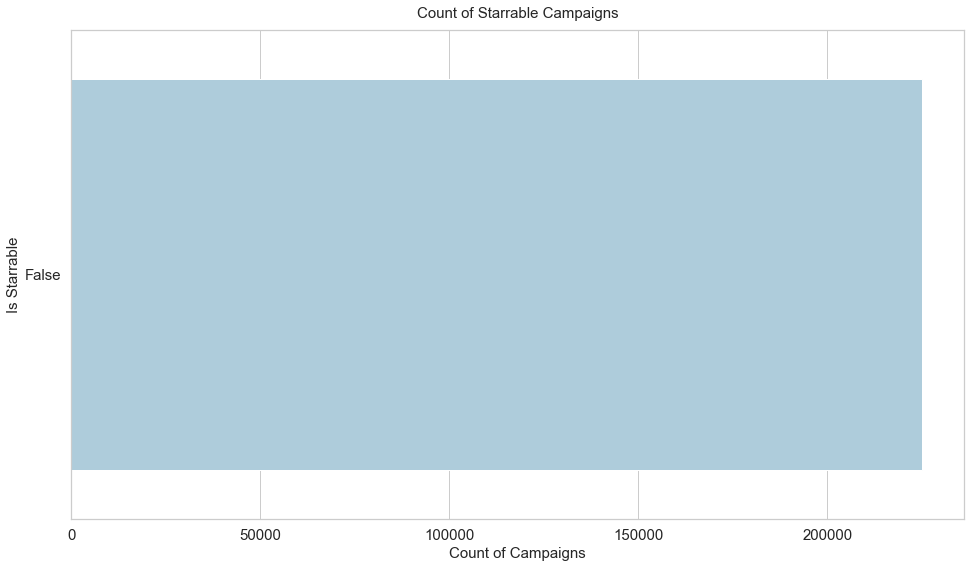

In [4]:
# starrable campaigns have a constant value of False
# There is no documentation on what this field does / is. 
# it is of no value for the analysis
starrable_campaigns_count = sns_count_plot(y='is_starrable', order='is_starrable',
                                           title='Count of Starrable Campaigns', 
                                           xlabel='Count of Campaigns', ylabel='Is Starrable', data=df)

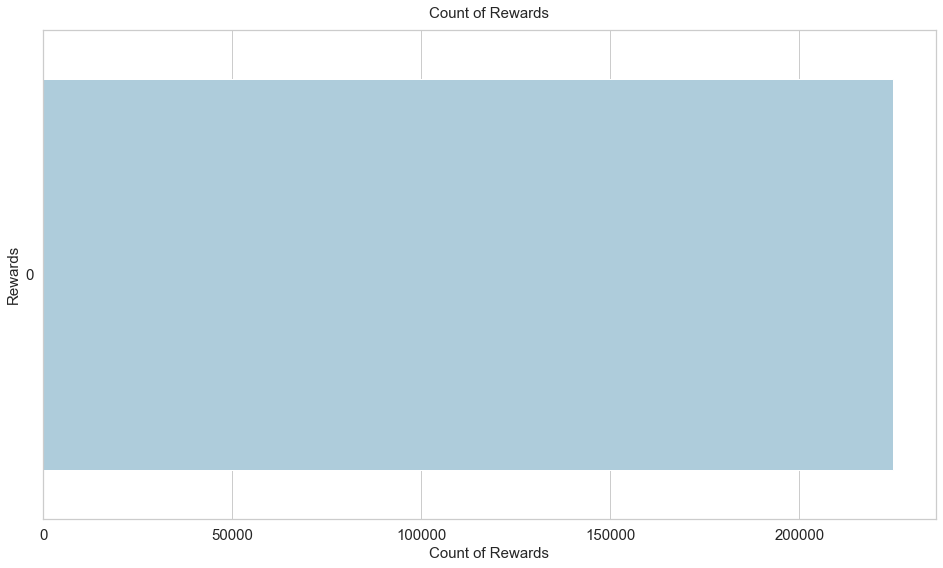

In [5]:
# The intension was to get the reward count per campaign. Wasn't possible.
# wont be useful for analysis
reward_count = sns_count_plot(y='reward_count', order='reward_count',
                              title='Count of Rewards', 
                              xlabel='Count of Rewards', ylabel='Rewards', data=df)

In [6]:
# drop the to columns as per the above
drop_cols = ['is_starrable', 'reward_count']
df = df.drop(columns=drop_cols)

In [6]:
# run an eda report on pandas profiling
eda = pp.ProfileReport(df)
display(eda)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
# print the fields and data types
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 224895 entries, 0 to 294713
Data columns (total 24 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   campaign_id             224895 non-null  int64  
 1   creator_id              224895 non-null  int64  
 2   campaign_name           224895 non-null  object 
 3   description             224892 non-null  object 
 4   slug                    224895 non-null  object 
 5   parent_category         224895 non-null  object 
 6   category                224895 non-null  object 
 7   campaign_created_date   224895 non-null  object 
 8   campaign_launch_date    224895 non-null  object 
 9   campaign_end_date       224895 non-null  object 
 10  campaign_duration_days  224895 non-null  int64  
 11  goal_usd                224895 non-null  float64
 12  pledged                 224895 non-null  float64
 13  percent_funded          224895 non-null  int64  
 14  backers_count       

In [8]:
# print the sum total of null values
df.isnull().sum()

campaign_id               0
creator_id                0
campaign_name             0
description               3
slug                      0
parent_category           0
category                  0
campaign_created_date     0
campaign_launch_date      0
campaign_end_date         0
campaign_duration_days    0
goal_usd                  0
pledged                   0
percent_funded            0
backers_count             0
country                   0
state                     0
staff_pick                0
spotlight                 0
project_url               0
reward_url                0
creator_name              1
final_outcome             0
bin_final_outcome         0
dtype: int64

In [7]:
# drop all nulls. The nulls are in the creator name and description
# these values cannot be interpolated as they text data
df.dropna(inplace=True)

In [10]:
# dimentionality of the dataset
df.shape

(224891, 24)

In [11]:
# sum total of nulls after dropping them
df.isnull().sum()

campaign_id               0
creator_id                0
campaign_name             0
description               0
slug                      0
parent_category           0
category                  0
campaign_created_date     0
campaign_launch_date      0
campaign_end_date         0
campaign_duration_days    0
goal_usd                  0
pledged                   0
percent_funded            0
backers_count             0
country                   0
state                     0
staff_pick                0
spotlight                 0
project_url               0
reward_url                0
creator_name              0
final_outcome             0
bin_final_outcome         0
dtype: int64

In [12]:
# basic description of the dataset
df.describe()

,campaign_id,creator_id,campaign_duration_days,goal_usd,pledged,percent_funded,backers_count,bin_final_outcome
count,2.248910e+05,2.248910e+05,224891.000000,2.248910e+05,2.248910e+05,2.248910e+05,224891.000000,224891.000000
mean,1.073387e+09,1.072966e+09,32.612354,3.698530e+04,1.712939e+04,5.711396e+02,187.852609,0.597987
std,6.192757e+08,6.208554e+08,12.170910,1.034810e+06,1.569010e+05,3.885277e+04,1148.928446,0.490306
min,1.852000e+04,3.000000e+00,1.000000,1.000000e-02,0.000000e+00,0.000000e+00,0.000000,0.000000
25%,5.369567e+08,5.344053e+08,29.000000,1.473488e+03,1.517749e+02,3.000000e+00,5.000000,0.000000
50%,1.072657e+09,1.072323e+09,30.000000,5.000000e+03,1.843047e+03,1.030000e+02,32.000000,1.000000
75%,1.609460e+09,1.610272e+09,35.000000,1.224107e+04,7.666672e+03,1.420000e+02,107.000000,1.000000
max,2.147476e+09,2.147483e+09,91.000000,1.523501e+08,4.175415e+07,1.553204e+07,185341.000000,1.000000


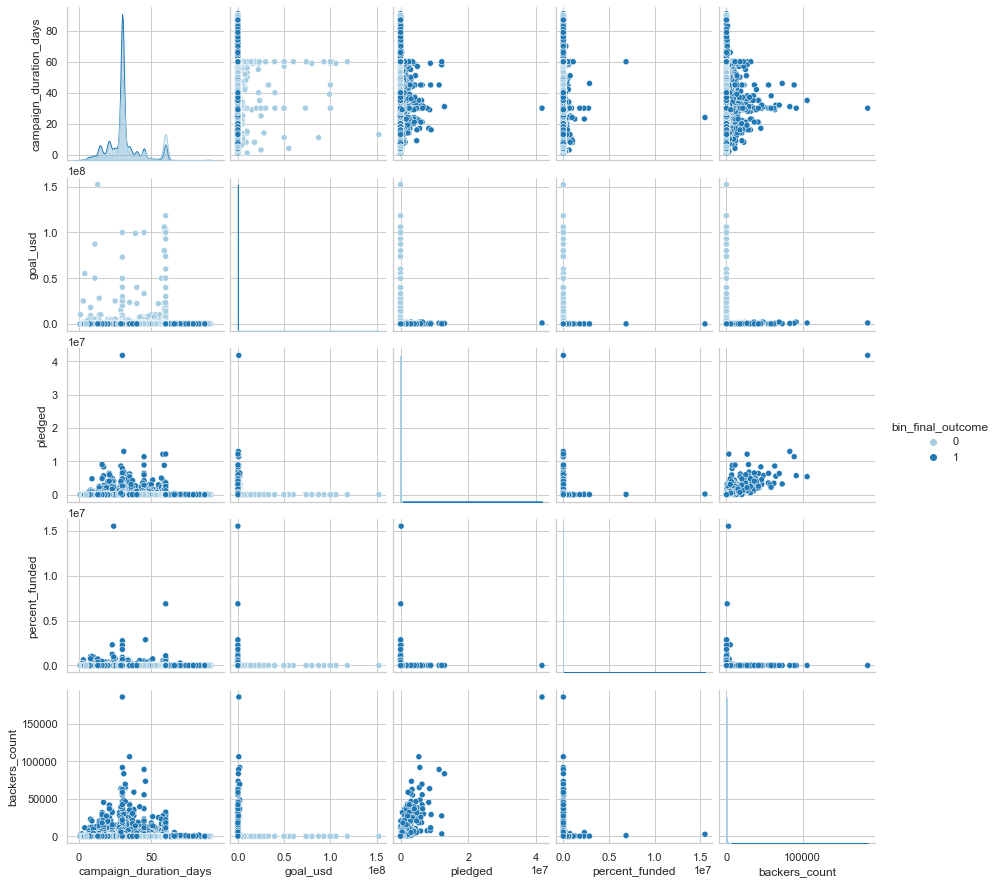

In [13]:
# scatter plots of the variables. There is no real correlations visible here 
# as the problem is classification not regression
cols = ['campaign_duration_days', 'goal_usd', 'pledged', 
        'percent_funded', 'backers_count', 'bin_final_outcome']
df_pair = df[cols]
sns.pairplot(df_pair, hue='bin_final_outcome', palette='Paired')

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h2 style='margin:10px 5px'>Data Transformation and Feature Engineering</h2>
</div>


In [8]:
# create a list of columns to drop
drop_cols = ['spotlight',
             'campaign_id',
             'creator_id',
             'category',
             'campaign_created_date',
             'campaign_launch_date',
             'campaign_end_date',
             'project_url',
             'reward_url',
             'creator_name',
             'state',
             ]
# cache the main category and percent funded to be used for text analysis later
# ensure they wont leak to the machine learning models
df['main_category'] = df['parent_category']
percent_funded = df.pop('percent_funded')
main_category = df.pop('main_category')

# group all the countries together to "RestOfWorld"
# besides USA and UK, as they have some predictive power
dict = {
        'Canada': 'RestOfWorld',
        'Australia': 'RestOfWorld',
        'New Zealand': 'RestOfWorld',
        'the Netherlands': 'RestOfWorld',
        'Sweden': 'RestOfWorld',
        'Ireland': 'RestOfWorld',
        'Denmark': 'RestOfWorld',
        'Norway': 'RestOfWorld',
        'Germany': 'RestOfWorld',
        'France': 'RestOfWorld',
        'Spain': 'RestOfWorld',
        'Italy': 'RestOfWorld',
        'Switzerland': 'RestOfWorld',
        'Austria': 'RestOfWorld',
        'Belgium': 'RestOfWorld',
        'Luxembourg': 'RestOfWorld',
        'Singapore': 'RestOfWorld',
        'Hong Kong': 'RestOfWorld',
        'Mexico': 'RestOfWorld',
        'Japan': 'RestOfWorld',
        'Poland': 'RestOfWorld',
        'Greece': 'RestOfWorld',
        'Slovenia': 'RestOfWorld'}
    
# apply the country mapping
df = df.replace({'country': dict})

# drop the following columns as they serve no purpose for the analysis
ml_df = df.drop(columns=drop_cols)

# create dummy variables using one hot encoding and drop a field to ensure to avoid the dummy variable trap
ml_df = pd.get_dummies(columns = ['country',  'parent_category', 'staff_pick'], drop_first=True, data=ml_df)

# create a new feature called char_count which is the length of the description
ml_df['char_count'] = ml_df['description'].str.len()

print(ml_df.columns)

Index(['campaign_name', 'description', 'slug', 'campaign_duration_days',
       'goal_usd', 'pledged', 'backers_count', 'is_starrable', 'reward_count',
       'final_outcome', 'bin_final_outcome', 'country_the United Kingdom',
       'country_the United States', 'parent_category_Comics',
       'parent_category_Crafts', 'parent_category_Dance',
       'parent_category_Design', 'parent_category_Fashion',
       'parent_category_Film & Video', 'parent_category_Food',
       'parent_category_Games', 'parent_category_Journalism',
       'parent_category_Music', 'parent_category_Photography',
       'parent_category_Publishing', 'parent_category_Technology',
       'parent_category_Theater', 'staff_pick_True', 'char_count'],
      dtype='object')


In [9]:
# checking if things are working ok with the one hot encoding
ml_df.head(2)

,campaign_name,description,slug,campaign_duration_days,goal_usd,pledged,backers_count,final_outcome,bin_final_outcome,country_the United Kingdom,...,parent_category_Food,parent_category_Games,parent_category_Journalism,parent_category_Music,parent_category_Photography,parent_category_Publishing,parent_category_Technology,parent_category_Theater,staff_pick_True,char_count
0,Smogr Alert Field Recording,Help me interview people for my design-focused...,smogr-alert-field-recording,65,640.0,41.0,3,failed,0,0,...,0,0,0,0,0,0,0,0,0,133
1,Icons for your iPhone apps,I make cool icons for iPhone developers at htt...,awesome-icons-for-your-iphone-apps,46,500.0,1820.0,98,successful,1,0,...,0,0,0,0,0,0,1,0,1,132


In [9]:
# create another list of columns to remove
excl_cols = ['bin_final_outcome', 'campaign_name', 'description',
             'slug', 'final_outcome', 'pledged',
             'parent_category_Theater', 'parent_category_Dance',  ]

# create the X variables for machine learning
# ensure not to have data leakage by remove the target variable
X = ml_df[ml_df.columns.difference(excl_cols)]

# create the target variable
y = ml_df['bin_final_outcome']

# apply a log 10 scaling on the variables below to ensure a normal distribution
# this will also handle outliers
X[['backers_count', 'campaign_duration_days', 'char_count', 'goal_usd']] = \
    np.log10(X[['backers_count', 'campaign_duration_days', 'char_count', 'goal_usd']])

# if there are any nan's as a result of the log 10 scaling, then
# replace them with values from the 98% percentile on the respective 
# column only
value = X['backers_count'].quantile(0.98)
X = X.replace(-np.inf, value)
X.describe()


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,backers_count,campaign_duration_days,char_count,country_the United Kingdom,country_the United States,goal_usd,parent_category_Comics,parent_category_Crafts,parent_category_Design,parent_category_Fashion,parent_category_Film & Video,parent_category_Food,parent_category_Games,parent_category_Journalism,parent_category_Music,parent_category_Photography,parent_category_Publishing,parent_category_Technology,reward_count,staff_pick_True
count,224891.000000,224891.000000,224891.000000,224891.000000,224891.000000,224891.000000,224891.000000,224891.000000,224891.000000,224891.000000,224891.000000,224891.000000,224891.000000,224891.000000,224891.000000,224891.000000,224891.000000,224891.000000,224891.0,224891.000000
mean,1.599767,1.481398,1.999433,0.115082,0.672379,3.628538,0.052279,0.025332,0.049624,0.057824,0.132180,0.071559,0.098883,0.016012,0.123553,0.028641,0.103437,0.107332,0.0,0.136084
std,0.909110,0.176748,0.176705,0.319122,0.469347,0.753599,0.222589,0.157133,0.217167,0.233410,0.338687,0.257757,0.298506,0.125522,0.329072,0.166794,0.304529,0.309536,0.0,0.342878
min,0.000000,0.000000,0.000000,0.000000,0.000000,-2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
25%,0.954243,1.462398,1.944483,0.000000,0.000000,3.168346,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
50%,1.643453,1.477121,2.075547,0.000000,1.000000,3.698970,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
75%,2.184691,1.544068,2.117271,0.000000,1.000000,4.087819,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
max,5.267972,1.959041,2.176091,1.000000,1.000000,8.182843,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000


<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h2 style='margin:10px 5px'>Test Train Split</h2>
</div>


In [10]:
# split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=25)

# create a balanced dataset using Synthetic Minority Over-Sampling Technique(SMOTE)
# this is only done on the training set
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote= smote.fit_resample(X_train, y_train)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h2 style='margin:10px 5px'>Brief exploratory analysis on the variables to be used for maching learning </h2>
</div>


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Text(0.5, 1.0, 'Correlation Heatmap')

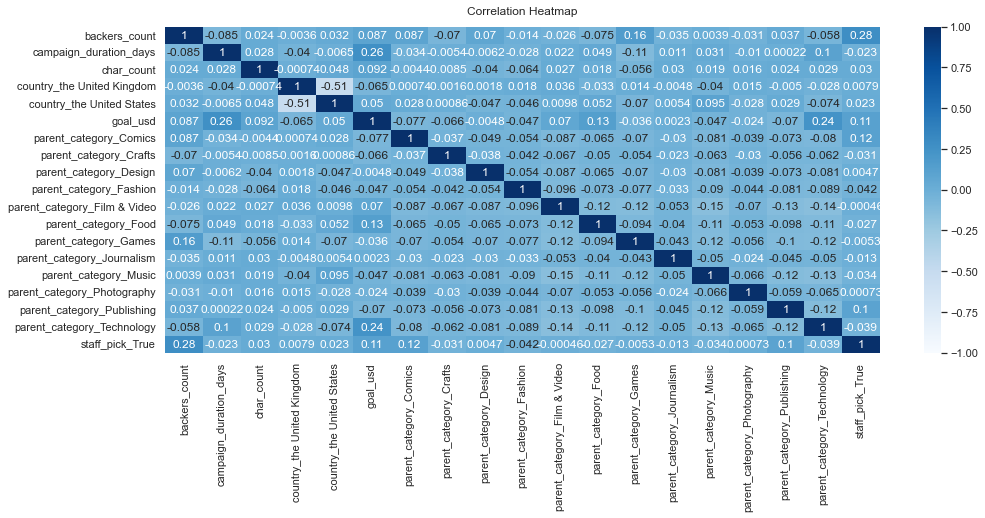

In [21]:
# show the report
eda = pp.ProfileReport(X_train_smote)
display(eda)

# print a correlation plot as a final confirmation
plt.figure(figsize=(16, 6))
corr = sns.heatmap(X_train_smote.corr(), vmin=-1, vmax=1, annot=True, cmap="Blues")
corr.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)


In [89]:
# perfrom variance inflation calculation on the X train to 
# check for multi-colinearity
vif = X_train_smote
vif =  compute_vif(vif)
vif

,Variable,VIF
0,backers_count,1.160100
1,campaign_duration_days,1.104330
2,char_count,1.022297
3,country_the United Kingdom,1.370223
4,country_the United States,1.404202
5,goal_usd,1.240858
6,parent_category_Comics,1.308916
7,parent_category_Crafts,1.180249
8,parent_category_Design,1.308858
9,parent_category_Fashion,1.356398


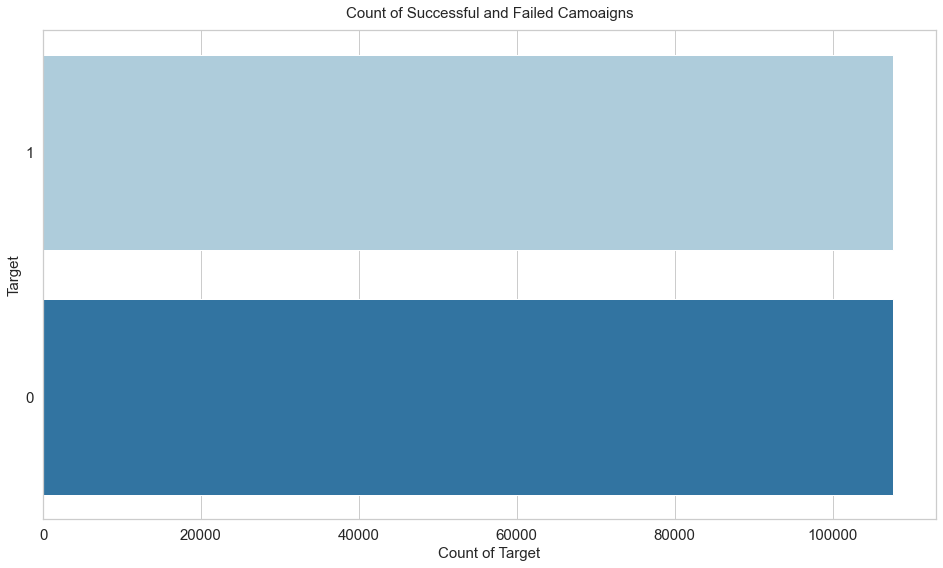

In [23]:
# Visualize the target variable after the Synthetic Minority Over-Sampling Technique(SMOTE)
df_smote = pd.DataFrame({'target': y_train_smote})
df_smote['target'] = df_smote['target'].astype(str)

oversampled_data = sns_count_plot(y='target', order='target',
                                  title='Count of Successful and Failed Camoaigns', 
                                  xlabel='Count of Target', ylabel='Target', data=df_smote)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h2 style='margin:10px 5px'>Machine Learning</h2>
</div>
<div class="alert alert-info" style="background-color:MediumSeaGreen; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h4 style='margin:10px 5px'>Baseline</h4>
</div>

Precision: 0.81 | Recall: 0.84 | F1 Score: 0.83 | Accuracy: 0.79134707 | 


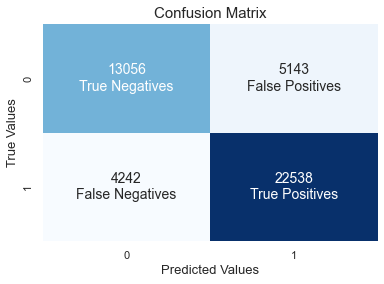

In [13]:
# instantiate naieve bayes
baseline = naive_bayes.GaussianNB()
# fit the model
baseline.fit(X_train_smote, y_train_smote)
# get the prediction
y_pred = baseline.predict(X_test)
# evaluate
evaluate_model(y_test, y_pred)

<div class="alert alert-info" style="background-color:MediumSeaGreen; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h4 style='margin:10px 5px'>Logistic Regression</h4>
</div>

Precision: 0.85 | Recall: 0.85 | F1 Score: 0.85 | Accuracy: 0.82480713 | 


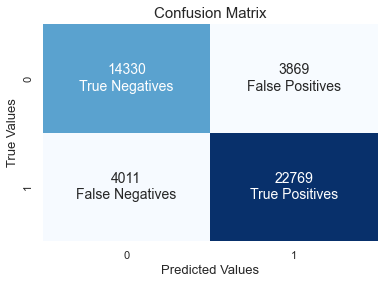

In [27]:
# instantiate logistic regression
svc_model = LogisticRegression(C=10000.0, penalty='l2')
# fit the model
svc_model.fit(X_train_smote, y_train_smote)
# get the prediction
y_pred = svc_model.predict(X_test)
# evaluate
evaluate_model(y_test, y_pred)

<div class="alert alert-info" style="background-color:MediumSeaGreen; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h4 style='margin:10px 5px'>Support Vector Machine</h4>
</div>

Precision: 0.95 | Recall: 0.94 | F1 Score: 0.95 | Accuracy: 0.93583672 | 


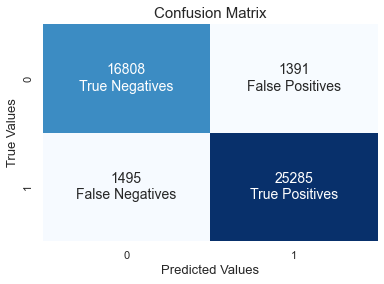

In [12]:
# instantiate support vector machine
svc_model = SVC(C=100, gamma=0.1, probability=True)
# fit the model
svc_model.fit(X_train_smote, y_train_smote)
# get the prediction
y_pred = svc_model.predict(X_test)
# evaluate
evaluate_model(y_test, y_pred)

<div class="alert alert-info" style="background-color:MediumSeaGreen; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h4 style='margin:10px 5px'>Decision Tree</h4>
</div>

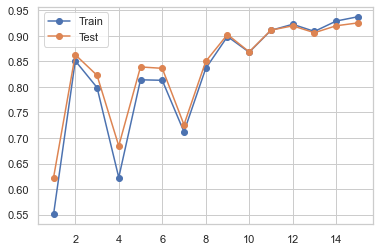

Precision: 0.94 | Recall: 0.94 | F1 Score: 0.94 | Accuracy: 0.92560973 | 


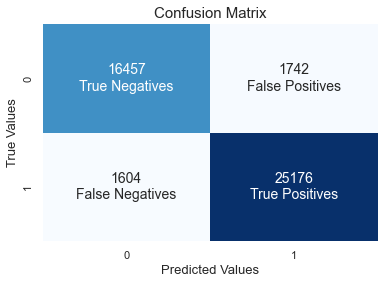

In [32]:
train_scores, test_scores = [], []
values = [i for i in range(1, 16)]

# loop through the depth of the tree
for i in values:
	# instantiate Decisiontree classier
	model = DecisionTreeClassifier(criterion='entropy', max_depth=i, max_features='auto')
	# fit the model
	model.fit(X_train_smote, y_train_smote)
	# evaluate train 
	train_yhat = model.predict(X_train_smote)
	# get the accuracy score for train
	train_acc = accuracy_score(y_train_smote, train_yhat)
	# append results to a list
	train_scores.append(train_acc)
	# evaluate on the test dataset
	test_yhat = model.predict(X_test)
	# get the accuracy score for test
	test_acc = accuracy_score(y_test, test_yhat)
	# append results to a list
	test_scores.append(test_acc)

# final prediction
y_pred = model.predict(X_test)
# plot the training and test curves
plt.plot(values, train_scores, '-o', label='Train')
plt.plot(values, test_scores, '-o', label='Test')
plt.legend()
plt.show()
# final evaluation
evaluate_model(y_test, y_pred)

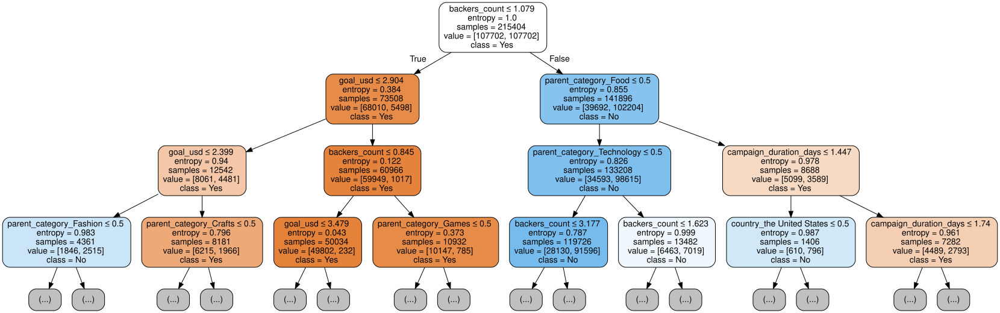

In [33]:
# plot the tree to 3 deep only.
tree_plot = export_graphviz(model, max_depth=3,
                            out_file=None,
                            feature_names=X.columns,
                            class_names=['Yes', 'No'],
                            filled=True, rounded=True,
                            special_characters=True)
graph = graphviz.Source(tree_plot)
graph

<div class="alert alert-info" style="background-color:MediumSeaGreen; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h4 style='margin:10px 5px'>Random Forest</h4>
</div>

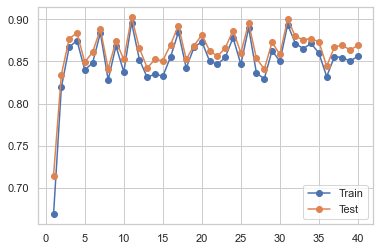

Precision: 0.86 | Recall: 0.93 | F1 Score: 0.89 | Accuracy: 0.86893884 | 


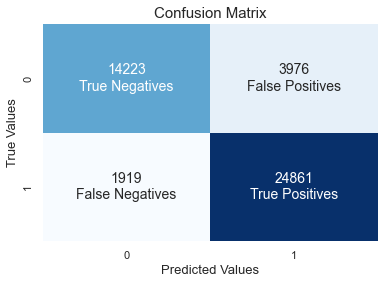

In [34]:
train_scores, test_scores = [], []
values = [i for i in range(1, 41)]
# loop through the depth of the tree
for i in values:
    # instantiate randomforest classier
    model = RandomForestClassifier(bootstrap=False, max_depth=4, max_features='sqrt', n_estimators=i)
    # fit the model
    model.fit(X_train_smote, y_train_smote)
    # predict train
    train_yhat = model.predict(X_train_smote)
    # get train accuracy
    train_acc = accuracy_score(y_train_smote, train_yhat)
    # append results to the list
    train_scores.append(train_acc)
    # evaluate on the test dataset
    test_yhat = model.predict(X_test)
    # get accuracy score for test
    test_acc = accuracy_score(y_test, test_yhat)
    # append results to list
    test_scores.append(test_acc)

# get final prediction
y_pred = model.predict(X_test)
# plot the test and training curves
plt.plot(values, train_scores, '-o', label='Train')
plt.plot(values, test_scores, '-o', label='Test')
plt.legend()
plt.show()
# final evaluation
evaluate_model(y_test, y_pred)

<div class="alert alert-info" style="background-color:MediumSeaGreen; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h4 style='margin:10px 5px'>Probit Regression</h4>
</div>

Optimization terminated successfully.
         Current function value: 0.471993
         Iterations 6
Precision: 0.85 | Recall: 0.82 | F1 Score: 0.84 | Accuracy: 0.81046711 | 


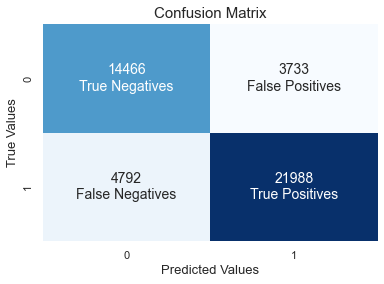

In [35]:
# instantiate probit regression
model = Probit(y_train_smote, X_train_smote)
# create coefficient dataframe
coef = pd.DataFrame(model.fit().params, columns={'coef'},)
coef['columns'] = coef.index
# create a json of coefficient
coef = coef.to_dict('records')
# create a json of x_test
X_test_dict = X_test.to_dict('records')
# get the y pred
y_pred = get_y_pred(X_test_dict, coef)
# evaluate model
evaluate_model(y_test, y_pred)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h2 style='margin:10px 5px'>Sentitment and Text Analytics</h2>
</div>
<div class="alert alert-info" style="background-color:MediumSeaGreen; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h4 style='margin:10px 5px'>Sentiment</h4>
</div>

In [7]:
df = ml_df[(ml_df['final_outcome'] == 'successful') | (ml_df['final_outcome'] == 'failed')]
df['description'] = df['description'].astype(str)
# get the sentiment analysis
df['sentiment_score'] = df['description'].apply(get_sentiment)
# add back the cached variable that were removed earlier
df = df.join(main_category)
df = df.join(percent_funded)

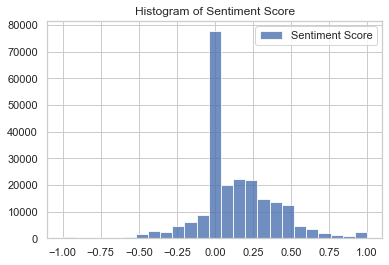

In [8]:
# Once the sentiment score is done, remap the values into something more usable
''' 
from (-1, -0.5) to 1 = very negative
from (-0.5, -0.1) to 2 = negative
from (-0.1, 0.1) to 3 = neutral
from (0.1, 0.5) to 4 = positive
from (0.5, 1) to 5 = very positive
'''
col = 'sentiment_score'
buckets = [

    df[col].between(-1, -0.5),
    df[col].between(-0.5, -0.1),
    df[col].between(-0.1, 0.1),
    df[col].between(0.1, 0.5),
    df[col].between(0.5, 1),
]
sent = ["1", "2", "3", "4", "5"]
sent_label = ['Highly Positive', 'Positive', 'Neutral', 'Negative', 'Highly Negative']
# apply the mapping
df["sentiment"] = np.select(buckets, sent, default=np.nan)
df["sentiment_label"] = np.select(buckets, sent_label, default=np.nan)
x = df['sentiment_score'].to_list()
# visualize the distribution
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [16, 9]
plt.title("Histogram of Sentiment Score", fontdict=None, loc='center', pad=None)
plt.hist(x, bins=25, alpha=0.8, label='Sentiment Score')
plt.legend(loc='upper right')
plt.show() 

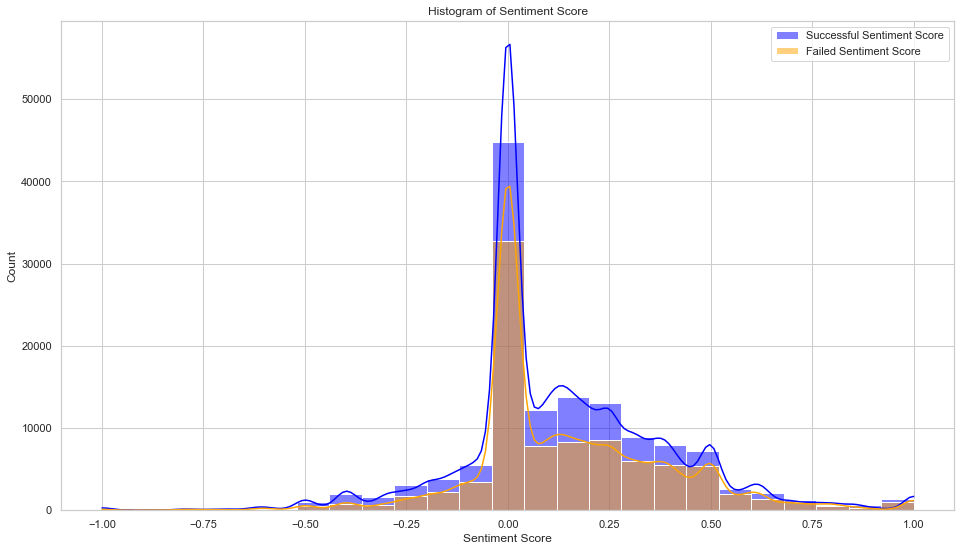

In [18]:
# visualize the distribution
x_success = df.loc[df['final_outcome']=='successful']['sentiment_score']
x_fail = df.loc[df['final_outcome']=='failed']['sentiment_score']
# apply the theme
sns.set_theme(style="whitegrid")
ax = plt.subplots()
# get the plot for the successful campaigns
ax = sns.histplot(x_success, bins = 25, kde = True, color = 'blue', label='Successful Sentiment Score' )
# get the plot for the failed campaign
ax = sns.histplot(x_fail, bins = 25, kde = True, color = 'orange', label='Failed Sentiment Score')
# set x axis label
ax.set(xlabel="Sentiment Score", ylabel="Count")
plt.title("Histogram of Sentiment Score", fontdict=None, loc='center', pad=None)
plt.legend(loc='upper right')
plt.show()

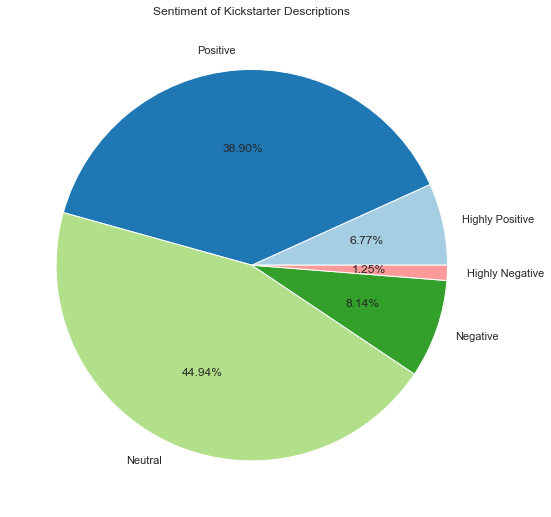

In [19]:
# draw entire sentiment pie chart
sent = draw_plot(df, 
                 "Sentiment of Kickstarter Descriptions",
                 "Sentiment of Kickstarter Descriptions")

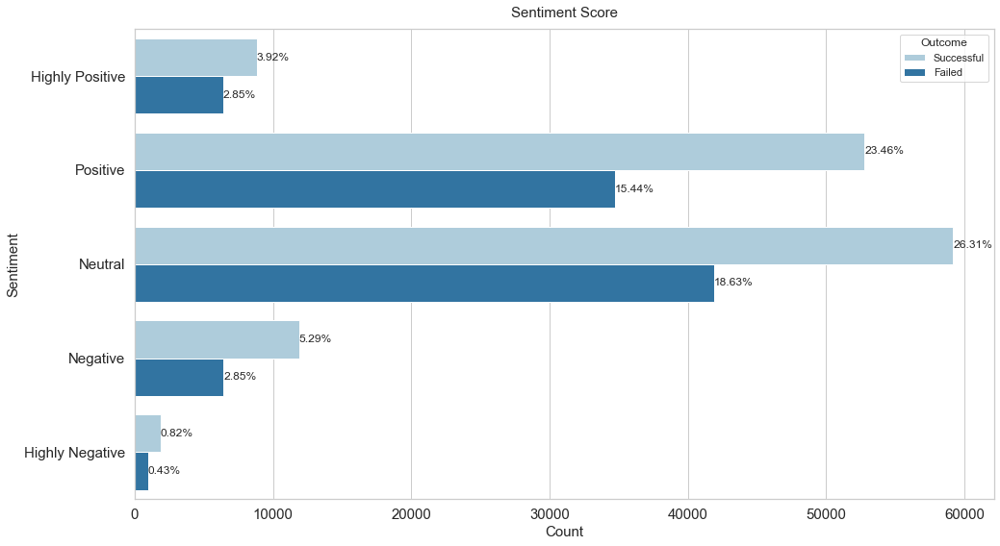

In [63]:
sent_df = pd.concat([create_sent_df(df[df['final_outcome'] == 'successful']), 
                     create_sent_df(df[df['final_outcome'] == 'failed'], 
                                    type='failed')])

sns.set(font_scale=3) 
sns.set_theme(style="whitegrid")
plt.figure(figsize=(16, 9))
# plot the data
ax = sns.barplot(y='Sentiment Label', 
                 x='Count of Sentiment Score',
                hue='Final Outcome',
                data=sent_df, 
                palette = 'Paired',
                ci=None)
# Format the plot
leg = ax.get_legend()
leg.set_title("Outcome")
labs = leg.texts
labs[0].set_text("Successful")
labs[1].set_text("Failed")

# set the titles
ax.set_title('Sentiment Score', fontdict={'fontsize':15}, pad=12)
ax.set_xlabel('Count' ,fontdict={'fontsize':15})
ax.set_ylabel('Sentiment',fontdict={'fontsize':15})
ax.tick_params(axis='both', labelsize=15)

# calculate and plot percentages on the plot
total = 224891
for p in ax.patches:
    percentage = '{:.2f}%'.format(100 * p.get_width() / total)
    x = p.get_x() + p.get_width() + 0.02
    y = p.get_y() + p.get_height()/2
    ax.annotate(percentage, (x, y), va='center', ha='left')
plt.show()

<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

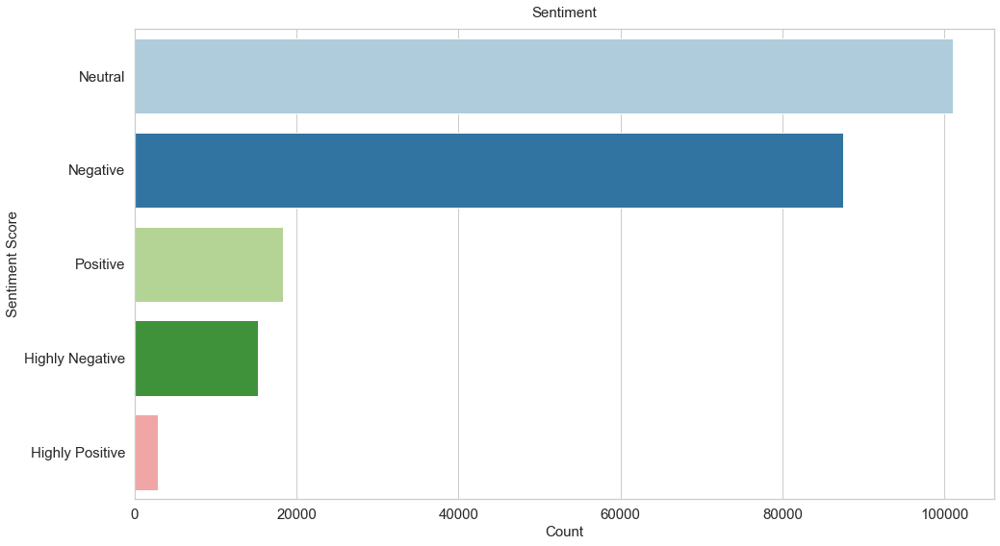

In [192]:
pd_df = df.sort_values('sentiment_score').reset_index()
# show the count of sentiment score
sns_count_plot(y='sentiment_label',
               order='sentiment_label',
               title='Sentiment',
               xlabel='Count',
               ylabel='Sentiment Score',
               data=pd_df)


Statistical analysis on sentiment scores for successful vs. failed Descriptions
* H0: The sentiment score has no impact on successful  or failed campaigns
* HA: The sentiment score has an impact on successful  or failed campaigns
P-value threshold: 0.05

In [66]:
from scipy import stats
# t-test
t_stat, p= stats.ttest_ind(df.loc[df['final_outcome']=='successful']['sentiment_score'],
                           df.loc[df['final_outcome']=='failed']['sentiment_score'],
                           equal_var=False)
print('T-Statistic: ',round(t_stat,2))
print('P-value: ',p)

T-Statistic:  -10.91
P-value:  1.1099273950196573e-27


The p-value is much smaller then the 0.05 significance level indicating that there is a significant difference between the sentiment score and the impact on successful or failed campaigns.

On this basis we have to reject the null hypothesis.

<div class="alert alert-info" style="background-color:MediumSeaGreen; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h4 style='margin:10px 5px'>Text Analytics</h4>
</div>

In [68]:
# create a new variable with a two part title
df['two_part_title'] = df['campaign_name'].str.split(':')
df['two_part_title'] = df['two_part_title'].str.len()

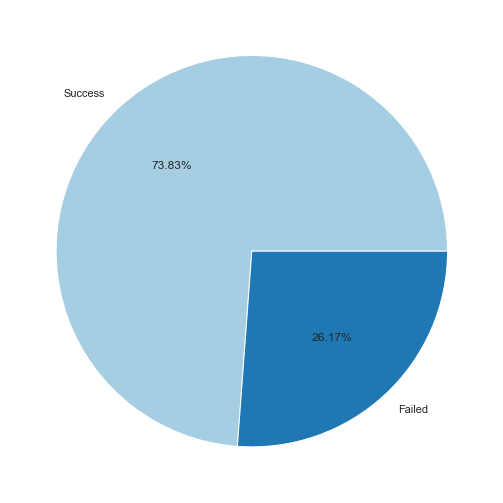

In [69]:
# two or more part title success
two_part_title = draw_sns(df.loc[df['two_part_title'] >= 2])

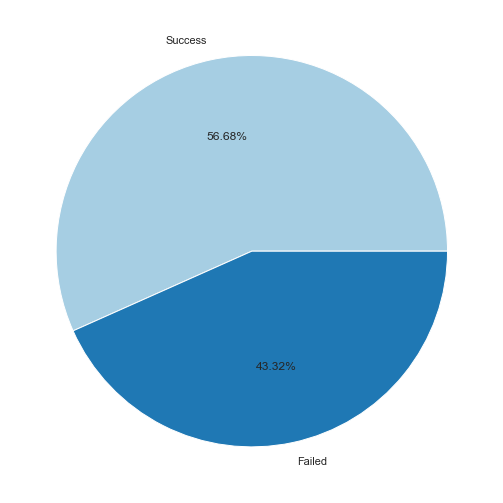

In [70]:
# one part title success vs failed
one_part_title = draw_sns(df.loc[df['two_part_title'] == 1])

Statistical analysis on Two Part Title for successful vs. failed campaigns
* H0: A Two Part Title has no statistical impact on successfull or failed campaigns
* HA: A Two Part Title has a statistical impact on successfull or failed campaigns

P-value threshold: 0.05

In [75]:
from scipy import stats
t_stat, p = stats.ttest_ind(df.loc[df['final_outcome']=='successful']['two_part_title'],
                           df.loc[df['final_outcome']=='failed']['two_part_title'],
                           equal_var=False)
print('T-Statistic: ',round(t_stat, 2))
print('P-value: ',p)

T-Statistic:  67.34
P-value:  0.0


The p-value is smaller then the 0.05 significance level indicating that there is a significant difference on a two part title having an impact on successfulor failed campaigns.

On this basis we have to reject the null hypothesis.

<div class="alert alert-info" style="background-color:MediumSeaGreen; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h4 style='margin:10px 5px'>Statistical analysis on length of a description</h4>
</div>

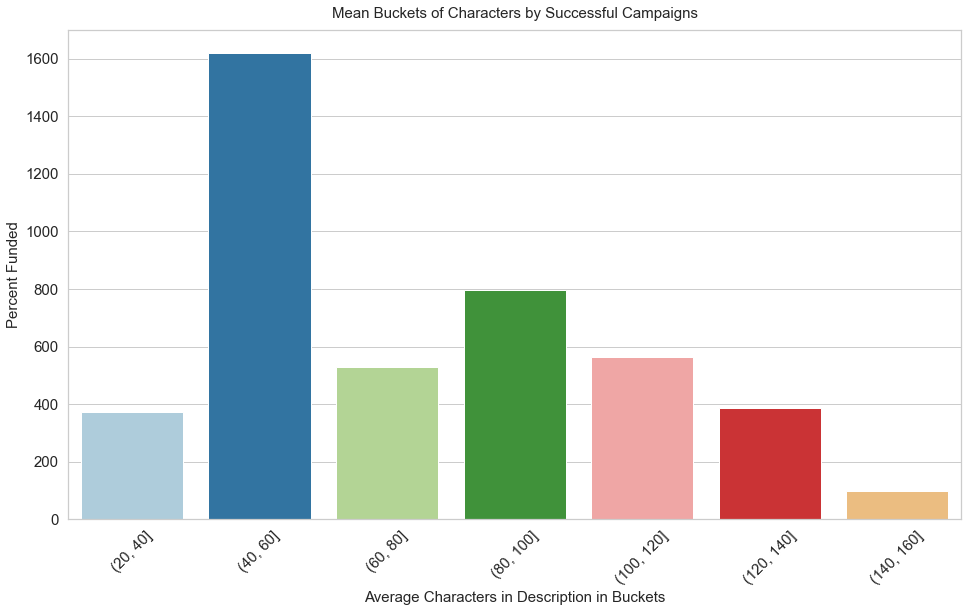

In [17]:
df['char_count'] = ml_df['description'].str.len()
# remove outliers for the variables final outcome, character count and percent funded
df_iqr = df[['final_outcome', 'char_count', 'percent_funded']]
# inter quartile range method will be used
df_iqr_s = df_iqr

# filter the dataset to successful campaigns only
df_iqr_s = df_iqr_s[df_iqr_s['percent_funded'] >= 100]

# create bins for characters to fall into for easier visualizations
bins = [20, 40, 60, 80, 100, 120, 140, 160]
# create the bucket
bucket = df['percent_funded'].groupby(pd.cut(df['char_count'], bins))
# get the mean
bucket = bucket.agg([np.mean]) 
#reset the index
bucket.reset_index(inplace=True)

# plot the results
plt.rcParams['figure.figsize'] = [16, 9]
ax = sns.barplot(x ='char_count', y="mean", palette='Paired', data=bucket)
# set the titles
ax.set_title('Mean Buckets of Characters by Successful Campaigns',
             fontdict={'fontsize':15},
             pad=12)
# set x axis title
ax.set_xlabel('Average Characters in Description in Buckets',
               fontdict={'fontsize':15})
# set y axis title
ax.set_ylabel('Percent Funded',
              fontdict={'fontsize':15})
ax.tick_params(axis='both', labelsize=15)
locs, labels = plt.xticks()
# set the roattaion to 45 degree
plt.setp(labels, rotation=45)
plt.show()

In [18]:
df_iqr.describe()

,char_count,percent_funded
count,224891.000000,2.248910e+05
mean,106.449653,5.711396e+02
std,30.630387,3.885277e+04
min,1.000000,0.000000e+00
25%,88.000000,3.000000e+00
50%,119.000000,1.030000e+02
75%,131.000000,1.420000e+02
max,150.000000,1.553204e+07


Statistical analysis on Description Length for successful vs. failed campaigns
* H0: The Description Length has no statistical impact on successful or failed campaigns
* HA: The Description Length has a statistical impact on successful or failed campaigns
P-value threshold: 0.05

In [75]:
# T-test: len of success and failed.
from scipy import stats
t_stat, p = stats.ttest_ind(df.loc[df['final_outcome']=='successful']['char_count'],
                           df.loc[df['final_outcome']=='failed']['char_count'],
                           equal_var=False)
print('T-Statistic: ',round(t_stat, 2))
print('P-value: ',p)

T-Statistic:  -21.87
P-value:  6.198317076499772e-106


The p-value is much smaller then the 0.05 significance level indicating that there is a significant difference between the description length and the impact on successful or failed campaigns.

On this basis we have to reject the null hypothesis.

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h2 style='margin:10px 5px'>Conclusions</h2>
</div>

In [2]:
# create the results dataframe
results_df = [{'Model': 'Baseline - Naive Bayes',
               'Accuracy': 0.79134707,
               'Time to Train (s)': 0.4},
               {'Model': 'Logistic Regession',
               'Accuracy': 0.82480713,
               'Time to Train (s)': 0.8},
               {'Model': 'Support Vector Machine',
               'Accuracy': 0.93583672,
               'Time to Train (s)': 10379},
               {'Model': 'Decision Tree',
               'Accuracy': 0.92560973,
               'Time to Train (s)': 4.1},
               {'Model': 'Random Forest',
               'Accuracy': 0.86893884,
               'Time to Train (s)': 82},
                {'Model': 'Probit Regression',
               'Accuracy': 0.81406711,
               'Time to Train (s)': 9320}  ]
results_df = pd.DataFrame(results_df)
# sort by Accuracy field in ascending order except the first row, ie. the benchmark
acc = results_df['Accuracy'].sub(results_df.loc[0, 'Accuracy']).abs().sort_values().index
ts = results_df['Time to Train (s)'].sub(results_df.loc[0, 'Time to Train (s)']).abs().sort_values().index
accuracy_df = results_df.loc[acc]
time_df = results_df.loc[ts]
accuracy_df

,Model,Accuracy,Time to Train (s)
0,Baseline - Naive Bayes,0.791347,0.4
5,Probit Regression,0.814067,9320.0
1,Logistic Regession,0.824807,0.8
4,Random Forest,0.868939,82.0
3,Decision Tree,0.925610,4.1
2,Support Vector Machine,0.935837,10379.0


Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


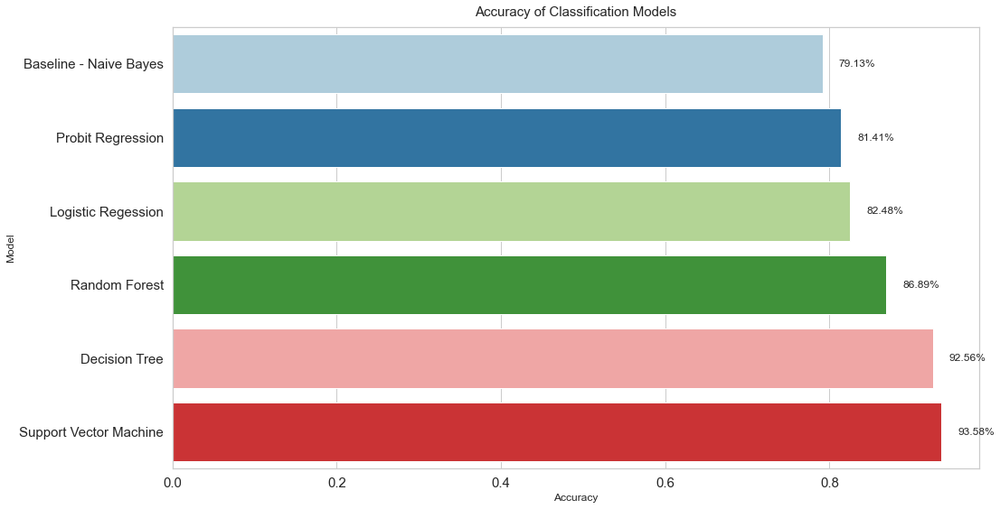

In [40]:
# plot accuracy of the model
# set x and y for the plot
x = accuracy_df['Model']
y = accuracy_df['Accuracy']

sns.set(font_scale=3) 
sns.set_theme(style="whitegrid")
plt.figure(figsize=(16, 9))
ax = sns.barplot(y, x, palette = 'Paired')

ax.set_title('Accuracy of Classification Models', fontdict={'fontsize':15}, pad=12)
ax.tick_params(axis='both', labelsize=15)


# calculate and plot percentages on the plot
total = float(len(y))
for p in ax.patches:
    percentage = '{:.2f}%'.format(100 * p.get_width())
    x = p.get_x() + p.get_width() + 0.02
    y = p.get_y() + p.get_height()/2
    ax.annotate(percentage, (x, y), va='center', ha='left')
plt.show()

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


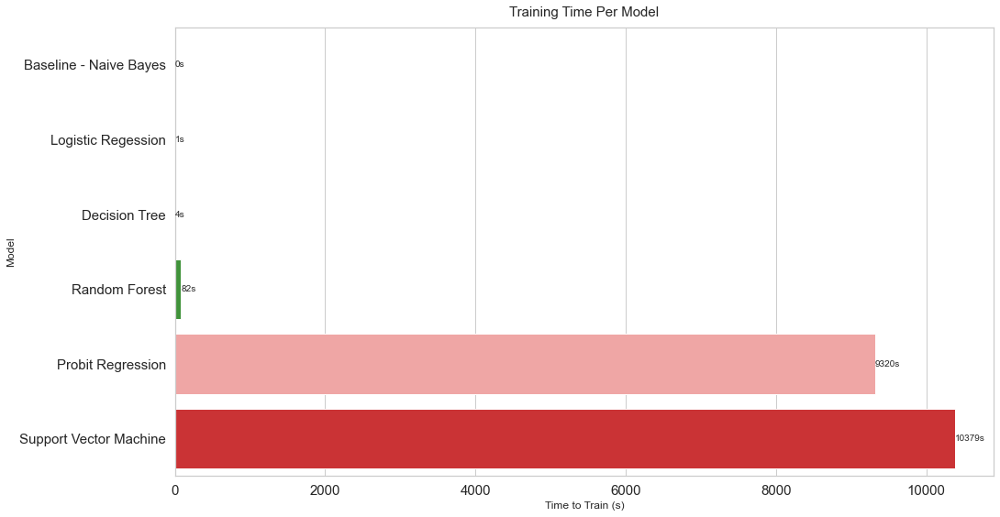

In [3]:
# Plot training times
x = time_df['Model']
y = time_df['Time to Train (s)']

sns.set(font_scale=3) 
sns.set_theme(style="whitegrid")
plt.figure(figsize=(16, 9))
ax = sns.barplot(y, x, palette = 'Paired')

ax.set_title('Training Time Per Model', fontdict={'fontsize':15}, pad=12)
ax.tick_params(axis='both', labelsize=15)

total = float(len(y))
for p in ax.patches:
    percentage = '{:.0f}s'.format(p.get_width())
    x = p.get_x() + p.get_width() + 0.02
    y = p.get_y() + p.get_height()/2
    ax.annotate(percentage, (x, y), va='center', ha='left')
plt.show()

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h2 style='margin:10px 5px'>Feature Importance</h2>
</div>


X does not have valid feature names, but SVC was fitted with feature names
Using 215404 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/44979 [00:00<?, ?it/s]

X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=3.939e-01, with an active set of 1 regressors, and the smallest cholesky pivot element being 4.215e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=1.833e-01, with an active set of 2 regressors, and the smallest cholesky pivot element being 4.215e-08. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=1.597e-01, with an active set of 3 regressors, and the smallest cholesky pivot element being 4.215e-08. Reduce max_iter or increase eps parameters.
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with 

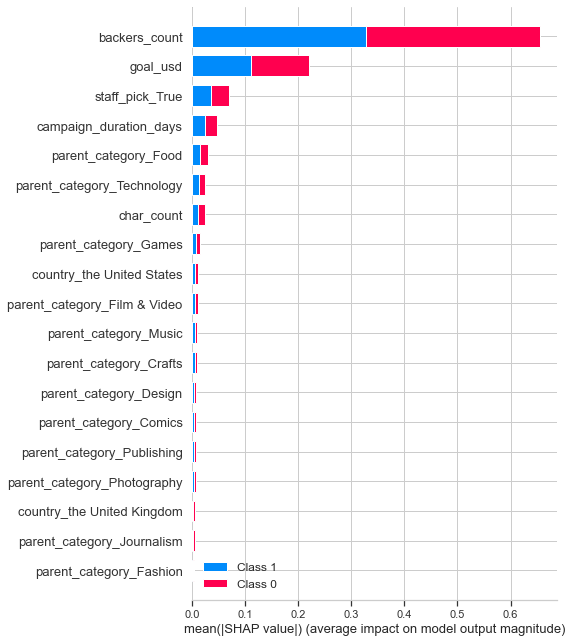

In [13]:
# feature importance with SHapley Additive exPlanations or SHAP
# take an incredibly long time to train.
importance = shap.KernelExplainer(svc_model.predict_proba, X_train_smote, link="logit")
shap_values = importance.shap_values(X=X_test, nsamples=10, l1_reg="num_features(4)")
shap.summary_plot(shap_values, X_test)

<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h2 style='margin:10px 5px'>Train on Full Dataset</h2>
</div>

In [71]:
# read the prepared csv files from the previous step
print('Importing Dataset')
df = pd.read_csv('C:\\Git\\GitAzure\\Shaun\\AstonDissertation\\src\\outputs\\all_years.csv')
# filter the dataset to represent only successful and failed campaigns
df = df[(df['final_outcome'] == 'successful') | (df['final_outcome'] == 'failed')]

print('applying pretransform steps')
# create a new binary column of the final outcome field
# 0 = failed
# 1 = successful
col = 'final_outcome'
buckets = [
    df[col]=='failed',
    df[col]=='successful'
]

bin = ["0", "1"]

# map the bin to the new binary column    
df["bin_final_outcome"] = np.select(buckets, bin, default=np.nan)
# make sure to change the datatyp to integer
df["bin_final_outcome"] = df["bin_final_outcome"].astype(int)

# drop the to columns as per the above
drop_cols = ['is_starrable', 'reward_count']
df = df.drop(columns=drop_cols)
df.dropna(inplace=True)
# create a list of columns to drop
drop_cols = ['spotlight',
             'campaign_id',
             'creator_id',
             'category',
             'campaign_created_date',
             'campaign_launch_date',
             'campaign_end_date',
             'project_url',
             'reward_url',
             'creator_name',
             'state',
             ]
# cache the main category and percent funded to be used for text analysis later
# ensure they wont leak to the machine learning models
df['main_category'] = df['parent_category']
percent_funded = df.pop('percent_funded')
main_category = df.pop('main_category')

# group all the countries together to "RestOfWorld"
# besides USA and UK, as they have some predictive power
dict = {
        'Canada': 'RestOfWorld',
        'Australia': 'RestOfWorld',
        'New Zealand': 'RestOfWorld',
        'the Netherlands': 'RestOfWorld',
        'Sweden': 'RestOfWorld',
        'Ireland': 'RestOfWorld',
        'Denmark': 'RestOfWorld',
        'Norway': 'RestOfWorld',
        'Germany': 'RestOfWorld',
        'France': 'RestOfWorld',
        'Spain': 'RestOfWorld',
        'Italy': 'RestOfWorld',
        'Switzerland': 'RestOfWorld',
        'Austria': 'RestOfWorld',
        'Belgium': 'RestOfWorld',
        'Luxembourg': 'RestOfWorld',
        'Singapore': 'RestOfWorld',
        'Hong Kong': 'RestOfWorld',
        'Mexico': 'RestOfWorld',
        'Japan': 'RestOfWorld',
        'Poland': 'RestOfWorld',
        'Greece': 'RestOfWorld',
        'Slovenia': 'RestOfWorld'}
    
# apply the country mapping
df = df.replace({'country': dict})

# drop the following columns as they serve no purpose for the analysis
ml_df = df.drop(columns=drop_cols)

print('creating dummy variables')
# create dummy variables using one hot encoding and drop a field to ensure to avoid the dummy variable trap
ml_df = pd.get_dummies(columns = ['country',  'parent_category', 'staff_pick'], drop_first=True, data=ml_df)

# create a new feature called char_count which is the length of the description
ml_df['char_count'] = ml_df['description'].str.len()

# create another list of columns to remove
excl_cols = ['bin_final_outcome', 'campaign_name', 'description',
             'slug', 'final_outcome', 'pledged',
             'parent_category_Theater', 'parent_category_Dance',  ]

# create the X variables for machine learning
# ensure not to have data leakage by remove the target variable
X = ml_df[ml_df.columns.difference(excl_cols)]

# create the target variable
y = ml_df['bin_final_outcome']

# apply a log 10 scaling on the variables below to ensure a normal distribution
# this will also handle outliers
X[['backers_count', 'campaign_duration_days', 'char_count', 'goal_usd']] = \
    np.log10(X[['backers_count', 'campaign_duration_days', 'char_count', 'goal_usd']])

# if there are any nan's as a result of the log 10 scaling, then
# replace them with values from the 98% percentile on the respective 
# column only
value = X['backers_count'].quantile(0.98)
X = X.replace(-np.inf, value)

print('balancing using smote')
smote = SMOTE(random_state=42)
X_smote, y_smote = smote.fit_resample(X, y)

print('training model')
# instantiate randomforest classier
model = SVC(C=100, gamma=0.1)
# fit the model
print('fitting the model')
model.fit(X_smote, y_smote)
print('done.... Time for a pickle...')

Importing Dataset
applying pretransform steps
creating dummy variables



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


balancing using smote
training model
fitting the model
done.... Time for a pickle...


<div class="alert alert-info" style="background-color:#006a79; color:white; padding:0px 10px; border-radius:5px;"> <a name="introduction"></a><h2 style='margin:10px 5px'>Save-Load the model for production</h2>
</div>

In [72]:
import pickle

# save
with open('svc_model.pkl','wb') as f:
    pickle.dump(model, f)

In [25]:
import pickle
# Test Prediction
backers_count = 35
campaign_duration_days = 30
char_count = 107
country_theUnitedKingdom = 0
country_theUnitedStates = 1
goal_usd = 4500
parent_category_Comics = 0
parent_category_Crafts = 0
parent_category_Design = 0
parent_category_Fashion = 0
parent_category_FilmandVideo = 0
parent_category_Food = 1
parent_category_Games = 0
parent_category_Journalism = 0
parent_category_Music = 0
parent_category_Photography = 0
parent_category_Publishing = 0
parent_category_Technology = 0
staff_pick_True = 0

data = [{'backers_count': backers_count,
  'campaign_duration_days': campaign_duration_days,
  'char_count': char_count,
  'country_the United Kingdom': country_theUnitedKingdom,
  'country_the United States': country_theUnitedStates,
  'goal_usd': goal_usd,
  'parent_category_Comics': parent_category_Comics,
  'parent_category_Crafts': parent_category_Crafts,
  'parent_category_Design': parent_category_Design,
  'parent_category_Fashion': parent_category_Fashion,
  'parent_category_Film & Video': parent_category_FilmandVideo,
  'parent_category_Food': parent_category_Food,
  'parent_category_Games': parent_category_Games,
  'parent_category_Journalism': parent_category_Journalism,
  'parent_category_Music': parent_category_Music,
  'parent_category_Photography': parent_category_Photography,
  'parent_category_Publishing': parent_category_Publishing,
  'parent_category_Technology': parent_category_Technology,
  'staff_pick_True': staff_pick_True }]

df = pd.DataFrame(data)
df

,backers_count,campaign_duration_days,char_count,country_the United Kingdom,country_the United States,goal_usd,parent_category_Comics,parent_category_Crafts,parent_category_Design,parent_category_Fashion,parent_category_Film & Video,parent_category_Food,parent_category_Games,parent_category_Journalism,parent_category_Music,parent_category_Photography,parent_category_Publishing,parent_category_Technology,staff_pick_True
0,35,30,107,0,1,4500,0,0,0,0,0,1,0,0,0,0,0,0,0


In [26]:
# load
with open('svc_model.pkl', 'rb') as f:
    model = pickle.load(f)
X = df
X[['backers_count', 'campaign_duration_days', 'char_count', 'goal_usd']] = \
    np.log10(X[['backers_count', 'campaign_duration_days', 'char_count', 'goal_usd']])
    
print(model.predict(X))

[1]
